<h1>Using LDA, QDA, SVM, K-means, and XGBoost on Spotify's Most Popular Songs</h1>

In the following project I utilize Linear Discriminant Analysis (LDA), Quadratic Discriminant Analysis
(QDA), and Support Vector Machines (SVM) techniques for classification. I then use K-means clustering and finally build a gradient bosoting model using XGBoost.

I will be using a dataset of songs collected using the Spotify API from the Kaggle at this link:
https://www.kaggle.com/datasets/purumalgi/music-genre-classification/data. The data was originally
collected for MachineHack Hackathon. It contains 17,996 rows with 17 columns. 
The following predictor variables are available:
* artist_name: Name of the artist (String)
* track_name: Name of the song (String)
* popularity: Popularity of the Song (float from 0 to 100)
* danceability: Whether the song is danceable or not (float from 0 to 1)
* energy: What is the energy level of the song (float from 0 to 1)
* key: The Key of the song is represented by an int for the note (integer from 1 to 11)
* loudness: What is the loudness of the music in Db (float from -inf to inf)
* mode: (int either 0 or 1)
* speechiness: amount of vocals in the song (float from 0 to 1)
* acousticness: A measure of how acoustic a song is. Songs with higher acousticness are more likely to use non-electronic instruments. (float from 0 to 1)
* instrumentalness: A measure of how likely it is that a song contains no vocals (float from 0 to 1)
* liveness: value describes the probability that the song was recorded live (float from 0 to 1)
* valence: Describes the musical positiveness conveyed by the song (float from 0 to 1)
* tempo: The overall estimated tempo of a track in beats per minute (int from 0 to inf)
* duration In milliseconds: How long is the song (float from 0 to inf)
* time_signature: Number that indicates how many counts are in each measure (Integer greater than 0)

It has one target variable, named class, with 11 classes representing the song belonging to one of the following. The Genres are ordered from 0 to 10:

* Rock 
* Indie 
* Alt 
* Pop 
* Metal 
* HipHop 
* Alt_Music
* Blues
* Acoustic/Folk
* Instrumental
* Country




In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import warnings
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import seaborn as sns
from tabulate import tabulate
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.svm import SVC

In [2]:
spotify_data = pd.read_csv('spotify_song_data.csv').dropna()
spotify_data

,track_ID,artist_name,track_name,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,class
1,2.0,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1.0,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4.0,10.0
2,3.0,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1.0,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4.0,6.0
4,5.0,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1.0,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4.0,10.0
5,6.0,The Stooges,Search and Destroy - Iggy Pop Mix,53.0,0.235,0.977,6.0,0.878,1.0,0.1070,0.003530,0.006040,0.1720,0.2410,152.952,208133.0,4.0,6.0
6,7.0,Solomon Burke,None Of Us Are Free,48.0,0.674,0.658,5.0,-9.647,0.0,0.1040,0.404000,0.000001,0.0981,0.6770,143.292,329387.0,4.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17991,17992.0,Green-House,Find Home,35.0,0.166,0.109,7.0,-17.100,0.0,0.0413,0.993000,0.824000,0.0984,0.1770,171.587,193450.0,3.0,6.0
17992,17993.0,Micatone,All Gone,27.0,0.638,0.223,11.0,-10.174,0.0,0.0329,0.858000,0.000016,0.0705,0.3350,73.016,257067.0,4.0,2.0
17993,17994.0,Smash Hit Combo,Peine perdue,34.0,0.558,0.981,4.0,-4.683,0.0,0.0712,0.000030,0.000136,0.6660,0.2620,105.000,216222.0,4.0,8.0
17994,17995.0,Beherit,Salomon's Gate,29.0,0.215,0.805,6.0,-12.757,0.0,0.1340,0.001290,0.916000,0.2560,0.3550,131.363,219693.0,4.0,8.0


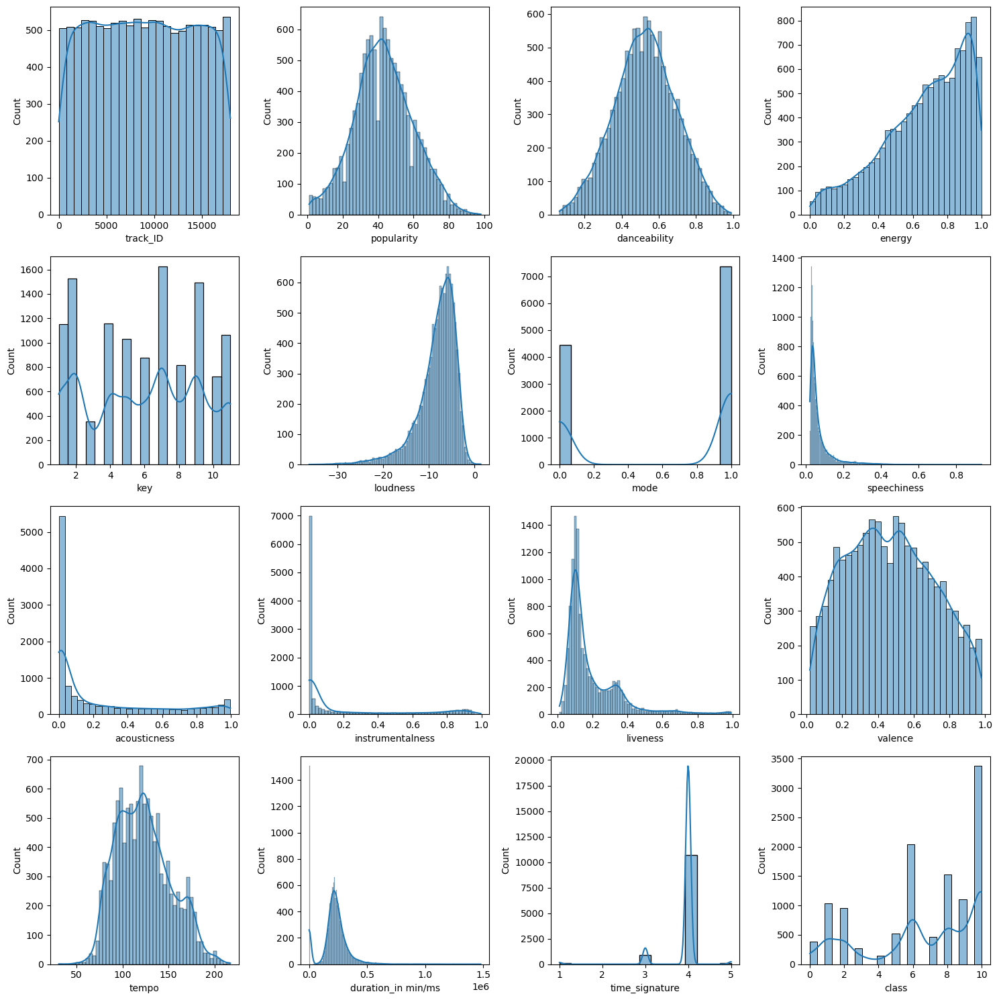

In [3]:
#examine each variable's distribtuion 

spotify_data = spotify_data.drop(['artist_name', 'track_name'], axis=1) # artist_name and track_name were dropped because they are strings

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))
axes = axes.flatten()

# Loop through each column and create a distribution plot
for i, column in enumerate(spotify_data.columns):
    sns.histplot(spotify_data[column], ax=axes[i], kde=True)

# Adjust layout to prevent overlapping titles
plt.tight_layout()
plt.show()

We scale all of the columns that arent already bewteen 0 and 1.

In [4]:
scaler = StandardScaler(copy=True, with_mean=True, with_std=True)
scale_columns = ['popularity', 'key', 'loudness', 'speechiness', 'tempo', 'duration_in min/ms', 'time_signature']
spotify_data[scale_columns] = scaler.fit_transform(spotify_data[scale_columns])
spotify_data

,track_ID,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,class
1,2.0,0.657863,0.382,0.814,-0.938545,0.232529,1.0,-0.450090,0.001100,0.004010,0.1010,0.5690,-0.220004,0.334812,0.225823,10.0
2,3.0,-0.488940,0.434,0.614,0.008660,-0.027879,1.0,-0.274522,0.486000,0.000196,0.3940,0.7870,0.841069,-0.891468,0.225823,6.0
4,5.0,0.597505,0.167,0.975,-1.254280,0.928601,1.0,2.137688,0.000169,0.016100,0.1720,0.0918,2.586894,0.146873,0.225823,10.0
5,6.0,0.597505,0.235,0.977,0.008660,2.145018,1.0,0.529548,0.003530,0.006040,0.1720,0.2410,1.020174,-0.041532,0.225823,6.0
6,7.0,0.295715,0.674,0.658,-0.307075,-0.337585,0.0,0.485287,0.404000,0.000001,0.0981,0.6770,0.691934,1.005103,0.225823,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17991,17992.0,-0.488940,0.166,0.109,0.324395,-2.095575,0.0,-0.439762,0.993000,0.824000,0.0984,0.1770,1.653379,-0.168273,-2.394660,6.0
17992,17993.0,-0.971804,0.638,0.223,1.587334,-0.461892,0.0,-0.563692,0.858000,0.000016,0.0705,0.3350,-1.695999,0.380854,0.225823,2.0
17993,17994.0,-0.549298,0.558,0.981,-0.622810,0.833307,0.0,0.001370,0.000030,0.000136,0.6660,0.2620,-0.609204,0.028290,0.225823,8.0
17994,17995.0,-0.851088,0.215,0.805,0.008660,-1.071162,0.0,0.927895,0.001290,0.916000,0.2560,0.3550,0.286594,0.058251,0.225823,8.0


<AxesSubplot:>

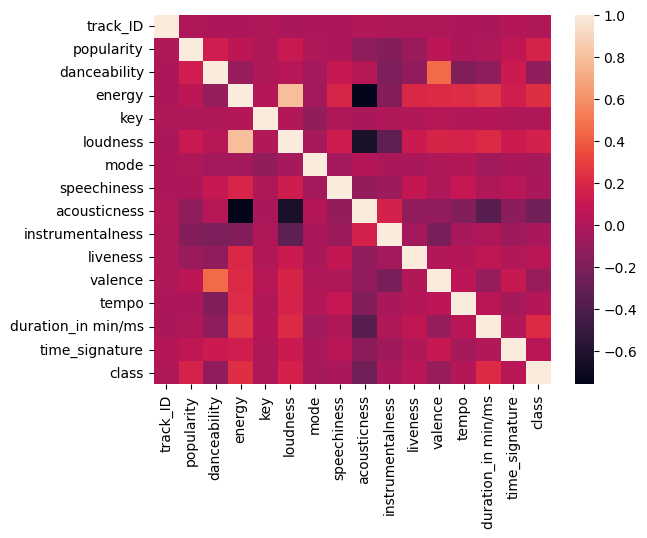

In [5]:
#examine correlations between variables
cor = spotify_data.corr()
sns.heatmap(data=cor)

We use 90% of the data for training and 10% of the data for testing. This split is done with the train_test_split function in sklearn.

In [6]:
y = spotify_data['class']
X = spotify_data.drop('class', axis=1) #note artist_name and track_name were dropped because they are strings
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10, random_state = 5)

Linear Discriminant Analysis (LDA) and Quadratic Discriminant Analysis (QDA) are both statistical techniques used in the field of machine learning and pattern recognition for classification tasks. LDA and QDA are supervised learning methods that aim to distinguish between two or more classes based on the features of the data. LDA assumes that the features follow a multivariate normal distribution and that the covariance matrix is common across all classes, making it particularly useful when the underlying data distribution is approximately linear. On the other hand, QDA relaxes the assumption of a common covariance matrix and allows each class to have its own covariance structure. This flexibility makes QDA more suitable for situations where the decision boundaries between classes are nonlinear or exhibit different variances. Both LDA and QDA are valuable tools in the analysis of complex datasets, providing insights into the structure and relationships within the data for effective classification.

<h2> LDA </h2>

In [7]:
#Default LDA model without any tuning - base metric
LDA_model_default = LinearDiscriminantAnalysis()
LDA_model_default.fit(X_train, y_train)
y_pred_LDA_default = LDA_model_default.predict(X_test)

# Create a DataFrame for LDA coefficients
lda_coefs_df = pd.DataFrame(LDA_model_default.coef_)
lda_coefs_df['Intercept'] = LDA_model_default.intercept_
lda_coefs_df.index.name = 'Class'
print("\nLinear Discriminant Analysis - Coefficients:")
lda_coefs_df


Linear Discriminant Analysis - Coefficients:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,Intercept
Class,,,,,,,,,,,,,,,,
0,-2.423809e-05,-0.532308,-1.215899,-3.046953,-0.089770,-0.042604,0.349158,-0.610679,2.898580,-0.545855,-0.887399,-2.020206,0.015180,-3.677916,-0.080297,-4.804714
1,2.032270e-06,0.190455,0.393506,-0.560938,0.021475,0.027619,0.070411,-0.039857,-0.859694,0.548128,-0.284978,0.535891,0.086944,0.284108,0.049154,-2.471840
2,7.059879e-06,-0.786324,0.036205,-2.796217,0.098917,0.270138,0.068370,-0.038041,1.896845,-1.452036,0.642770,4.037347,0.074490,0.777193,-0.171154,-3.933116
3,1.253069e-05,-1.242661,-7.014965,0.690757,-0.094919,-0.010585,-0.283237,-0.015393,8.668949,-0.599288,1.783453,4.964782,-0.438006,-3.428751,-0.306896,-11.842782
4,-5.612462e-06,0.645537,-0.898301,-2.051478,-0.029501,-0.589866,0.975048,-0.722053,0.001159,-0.913293,-0.292803,1.930684,-0.112719,-3.404837,-0.037736,-7.938217
5,-6.945298e-06,0.059840,9.075847,-4.714858,-0.061558,0.369883,-0.178829,2.260339,-1.980526,-0.676552,0.632924,-0.372194,-0.058238,0.634282,0.041612,-7.021083
6,-2.632996e-06,-0.121840,1.620150,-1.164261,0.043303,0.179031,0.097853,-0.035615,-0.520144,1.243386,-0.386438,0.191466,0.087025,0.299765,0.094379,-2.121162
7,3.089840e-05,0.371876,-4.924832,-2.289826,-0.062429,-2.269463,-0.524450,-0.248697,4.652881,7.334471,-0.540766,-1.969759,-0.302175,-4.460978,-0.214263,-12.282210
8,3.000939e-08,0.059342,-2.238318,6.676573,-0.056058,-0.259206,-0.071749,0.140979,-0.929981,0.114235,-0.408522,-3.717905,-0.042521,0.866485,-0.067094,-4.673871


The coefficients represent the weights assigned to each feature in the linear combination used to discriminate between classes. The intercept term is also included, representing the constant term in the linear equation.

In [8]:
# Print priors for LDA
lda_priors_df = pd.DataFrame({'Class': range(LDA_model_default.priors_.shape[0]), 'Prior Probability': LDA_model_default.priors_})
lda_priors_df.set_index('Class', inplace=True)
print("\nLinear Discriminant Analysis - Priors:")
lda_priors_df


Linear Discriminant Analysis - Priors:


,Prior Probability
Class,
0,0.032546
1,0.089832
2,0.081836
3,0.023140
4,0.011852
5,0.043552
6,0.170351
7,0.038002
8,0.128774


The section above prints the prior probabilities associated with each class in the LDA model. The priors represent the probabilities of each class occurring before observing any data. These probabilities are estimated from the training data.

TRAINING DATA:


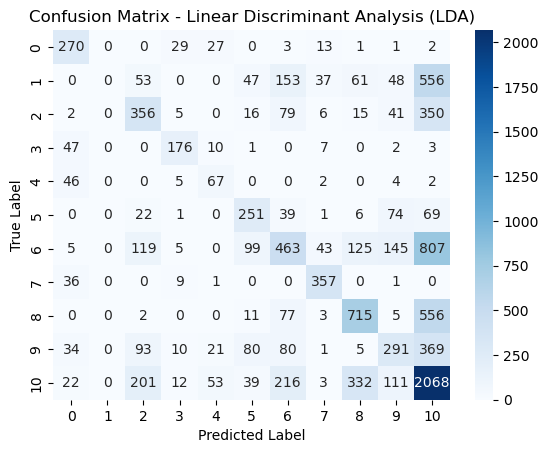

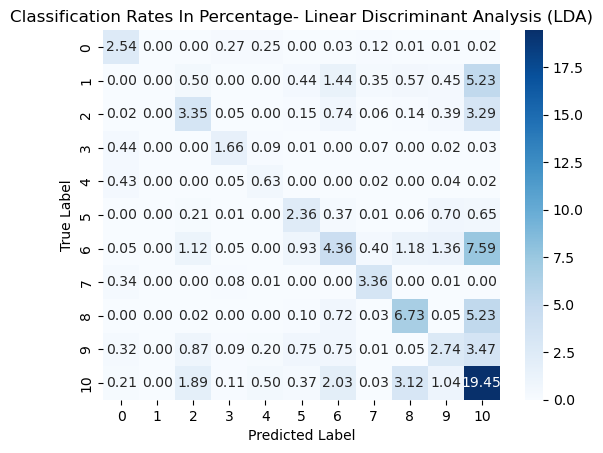

Accuracy Score - LDA: 0.4716395447276832


In [22]:
#Training Data
print("TRAINING DATA:")
y_pred_LDA_train = LDA_model_default.predict(X_train)
confus_mtrx_LDA_train = np.array(confusion_matrix(y_train, y_pred_LDA_train))
sns.heatmap(confus_mtrx_LDA_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates = (confus_mtrx_LDA_train / confus_mtrx_LDA_train.sum()) * 100
sns.heatmap(classification_rates, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score - LDA:', metrics.accuracy_score(y_train, y_pred_LDA_train))  

TESTING DATA


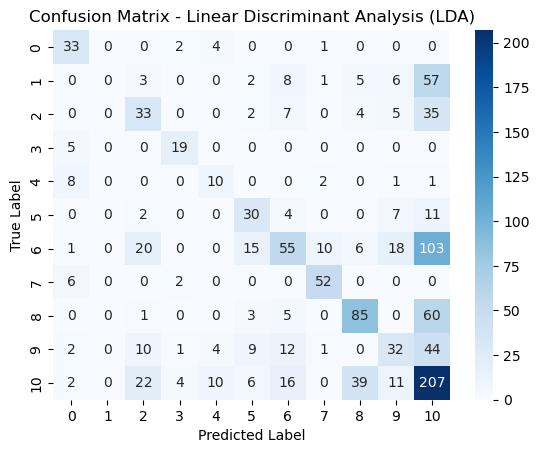

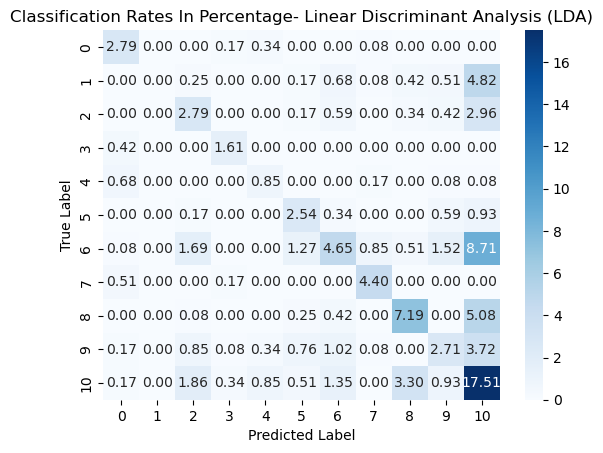

Accuracy Score - LDA: 0.4703891708967851


In [21]:
#Test Data
print("TESTING DATA:")
confus_mtrx_LDA = np.array(confusion_matrix(y_test, y_pred_LDA_default))
sns.heatmap(confus_mtrx_LDA, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates = (confus_mtrx_LDA / confus_mtrx_LDA.sum()) * 100
sns.heatmap(classification_rates, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score - LDA:', metrics.accuracy_score(y_test, y_pred_LDA_default))  

<h2> QDA </h2>

The absence of the equal covariance assumption in QDA implies that one class could exhibit much more variability in its feature values than another. This flexibility makes QDA particularly useful when dealing with datasets where the classes have distinct and possibly nonlinear shapes in the feature space. The decision boundaries in QDA are not constrained to be linear, as is the case in LDA. This characteristic allows QDA to model more complex relationships between features, enabling it to capture non-linear decision boundaries and better adapt to diverse patterns within the data.

/opt/anaconda3/lib/python3.9/site-packages/sklearn/discriminant_analysis.py:878: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")



Quadratic Discriminant Analysis - Priors:
TRAINING DATA:


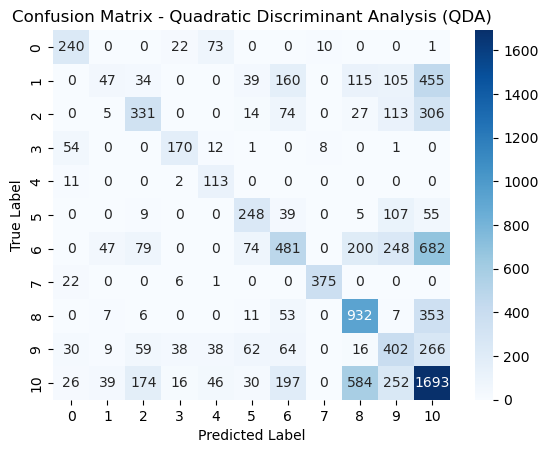

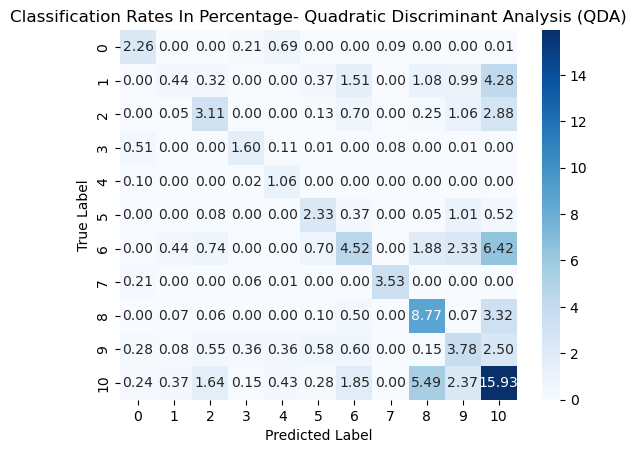

Accuracy Score (train )- QDA: 0.4733327062364782


In [26]:
#Base QDA
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.10, random_state = 5)
QDA_model_default = QuadraticDiscriminantAnalysis()
QDA_model_default.fit(X_train, y_train)

# Print priors for QDA
qda_priors_df = pd.DataFrame({'Class': range(QDA_model_default.priors_.shape[0]), 'Prior Probability': QDA_model_default.priors_})
qda_priors_df.set_index('Class', inplace=True)
print("\nQuadratic Discriminant Analysis - Priors:")
qda_priors_df

#train data evalution
y_pred_QDA_train =QDA_model_default.predict(X_train)

print("TRAINING DATA:")
confus_mtrx_QDA_train = np.array(confusion_matrix(y_train, y_pred_QDA_train))
sns.heatmap(confus_mtrx_QDA_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Quadratic Discriminant Analysis (QDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates_QDA = (confus_mtrx_QDA_train / confus_mtrx_QDA_train.sum()) * 100
sns.heatmap(classification_rates_QDA, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Quadratic Discriminant Analysis (QDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score (train) - QDA:', metrics.accuracy_score(y_train, y_pred_QDA_train))  


TESTING DATA:


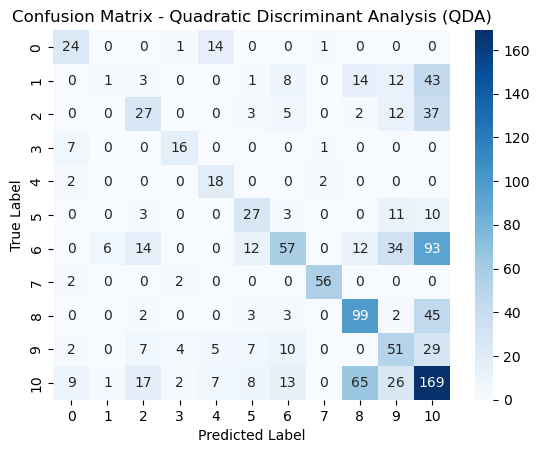

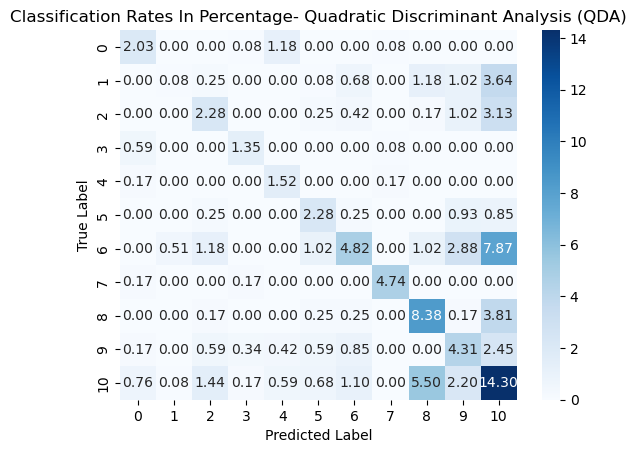

Accuracy Score (test) - QDA: 0.461082910321489


In [27]:
#Test data evalution
y_pred_QDA_test =QDA_model_default.predict(X_test)

print("TESTING DATA:")
confus_mtrx_QDA_test = np.array(confusion_matrix(y_test, y_pred_QDA_test))
sns.heatmap(confus_mtrx_QDA_test, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Quadratic Discriminant Analysis (QDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates_QDA = (confus_mtrx_QDA_test / confus_mtrx_QDA_test.sum()) * 100
sns.heatmap(classification_rates_QDA, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Quadratic Discriminant Analysis (QDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score (test) - QDA:', metrics.accuracy_score(y_test, y_pred_QDA_test))  


<h2> SVM </h2>

Support Vector Machines (SVM) is a powerful and versatile machine learning algorithm for both classification. At its core, SVM aims to find the optimal hyperplane in a high-dimensional space that best separates data points of different classes. The "support vectors," which are the data points closest to the decision boundary, play a crucial role in determining this hyperplane. SVM is particularly effective in scenarios with complex and non-linear relationships between features, thanks to the use of kernel functions that implicitly map the input data into a higher-dimensional space. This allows SVM to capture intricate decision boundaries and achieve high predictive accuracy. Additionally, SVM is robust in handling outliers due to its focus on the support vectors. 

SVM has several downsides such as:
1) Computational Intensity
Training an SVM, especially with non-linear kernels and large datasets, can be computationally intensive. The time complexity of SVM training is generally between O(n^2) and O(n^3), where n is the number of training samples. This makes SVM less scalable for very large datasets. 
2) Sensitivity to Noise
SVMs can be sensitive to noisy data, outliers, or overlapping classes. Outliers, in particular, can strongly influence the position and orientation of the decision boundary. 
3) Difficulty in Interpretability
Interpreting the decision boundaries in high-dimensional spaces, especially when non-linear kernels are used, can be challenging

17795     6.0
5061     10.0
12886     8.0
4806      8.0
9523      7.0
         ... 
15203    10.0
1159      6.0
14283    10.0
11139    10.0
13602     6.0
Name: class, Length: 118, dtype: float64
118
       track_ID  popularity  danceability  energy       key  loudness  mode  \
17795   17796.0    1.382160         0.490  0.6520 -1.254280  0.566766   1.0   
5061     5062.0    1.925382         0.404  0.9020 -1.570015  1.022716   1.0   
12886   12887.0    0.295715         0.489  0.9620 -0.307075  0.641303   0.0   
4806     4807.0   -0.609656         0.446  0.9220 -1.254280  0.297867   1.0   
9523     9524.0    0.657863         0.292  0.0382  0.640130 -2.121993   1.0   
...         ...         ...           ...     ...       ...       ...   ...   
15203   15204.0    0.174999         0.334  0.6360 -1.254280 -0.247009   1.0   
1159     1160.0   -0.006075         0.466  0.4450 -1.570015  0.697914   0.0   
14283   14284.0    0.114641         0.572  0.7350  0.955864  0.512750   1.0   
11139   111

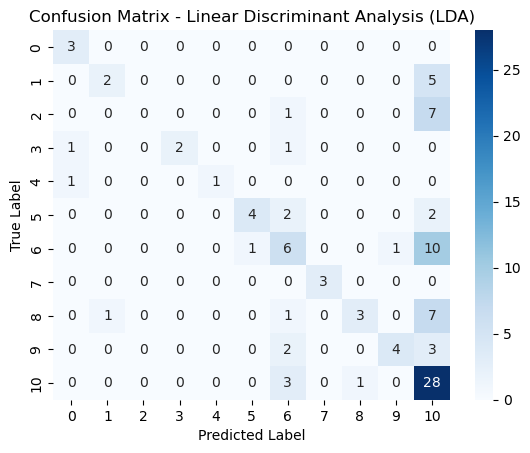

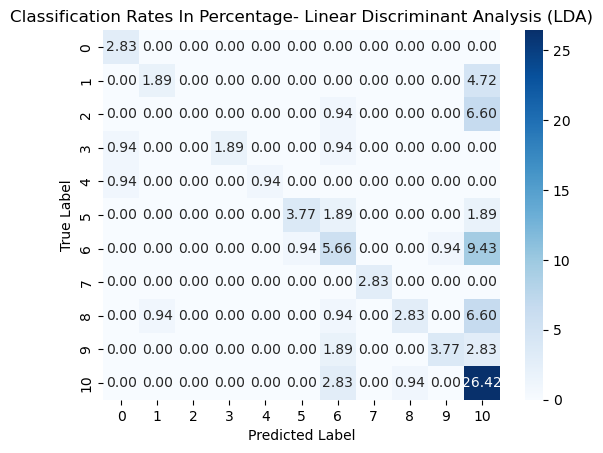

Accuracy Score - LDA: 0.5283018867924528


In [24]:
#SVM
#SVM is taking longer than 3 hours to run so I am taking a random subsample of 1% of rows to test the algorithm
spotify_data_sample = spotify_data.sample(frac=0.01, random_state=42)

y_SVM = spotify_data_sample['class']
X_SVM = spotify_data_sample.drop('class', axis=1) #note artist_name and track_name were dropped because they are strings

print(y_SVM)
print(len(y_SVM))
print(X_SVM)
print(len(X_SVM))

X_train_SVM, X_test_SVM, y_train_SVM, y_test_SVM = train_test_split(X_SVM, y_SVM, test_size = 0.10, random_state = 5)


svm = SVC(kernel='linear')
svm.fit(X_train_SVM,y_train_SVM)
y_pred_SVM_train = svm.predict(X_train_SVM)

#Training Data
print("TRAINING DATA:")
confus_mtrx_SVM_train = np.array(confusion_matrix(y_train_SVM, y_pred_SVM_train))
sns.heatmap(confus_mtrx_SVM_train, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates = (confus_mtrx_SVM_train / confus_mtrx_SVM_train.sum()) * 100
sns.heatmap(classification_rates, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score - LDA:', metrics.accuracy_score(y_train_SVM, y_pred_SVM_train))  

TESTING DATA:


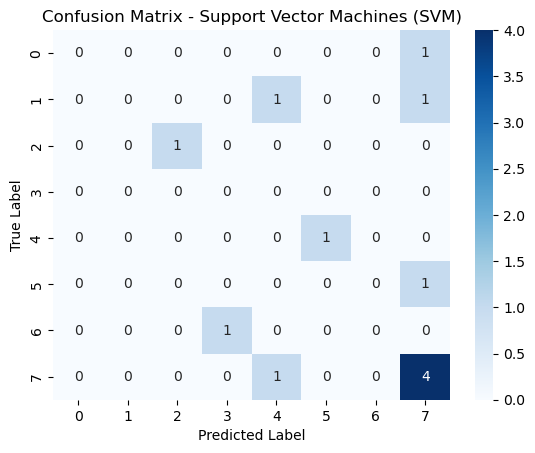

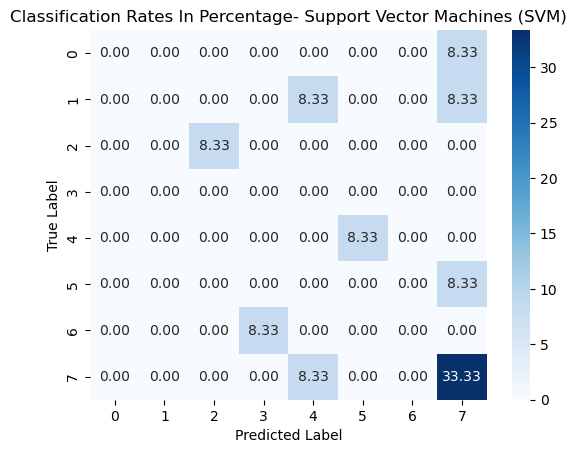

Accuracy Score - SVM: 0.4166666666666667


In [25]:
#test data
y_pred_SVM = svm.predict(X_test_SVM)
confus_mtrx_SVM = np.array(confusion_matrix(y_test_SVM, y_pred_SVM))
print("TESTING DATA:")
sns.heatmap(confus_mtrx_SVM, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Support Vector Machines (SVM)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

classification_rates = (confus_mtrx_SVM / confus_mtrx_SVM.sum()) * 100
sns.heatmap(classification_rates, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Support Vector Machines (SVM)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('Accuracy Score - SVM:', metrics.accuracy_score(y_test_SVM, y_pred_SVM))  

As we can see, SVM is unable to run on all 18k rows of data due to its computational complexity.

<h2> Clustering </h2>

K-means clustering is a widely used unsupervised machine learning algorithm designed for partitioning a dataset into distinct, non-overlapping groups or clusters. The primary objective of K-means is to assign data points to clusters in a way that minimizes the within-cluster sum of squares, effectively grouping similar data points together. The algorithm operates iteratively, with the number of clusters (K) predefined by the user. Initially, K centroids are randomly placed in the feature space, and data points are assigned to the nearest centroid. The centroids are then recalculated as the mean of the data points within each cluster, and the assignment process is repeated until convergence. K-means is known for its simplicity, efficiency, and scalability, making it a popular choice for various applications such as customer segmentation, image compression, and anomaly detection. While sensitive to the initial placement of centroids, K-means provides a practical and intuitive approach to discovering patterns within unlabeled datasets.

I will use K-means to cluster the same dataset of songs on spotify to create mathamtically accurate genres. First we will use K = 11 to attempt to recreate the class column of the orginnal dataset. I then will try to use K = 5 and K = 20 to exmine the imapct of less or more genres of music on data.

K = 1 Clusters
Cluster Counts:
9     2619
2     2372
4     1965
1     1511
10    1205
6     1011
0      639
8      315
5      132
3       29
7       15
Name: cluster, dtype: int64


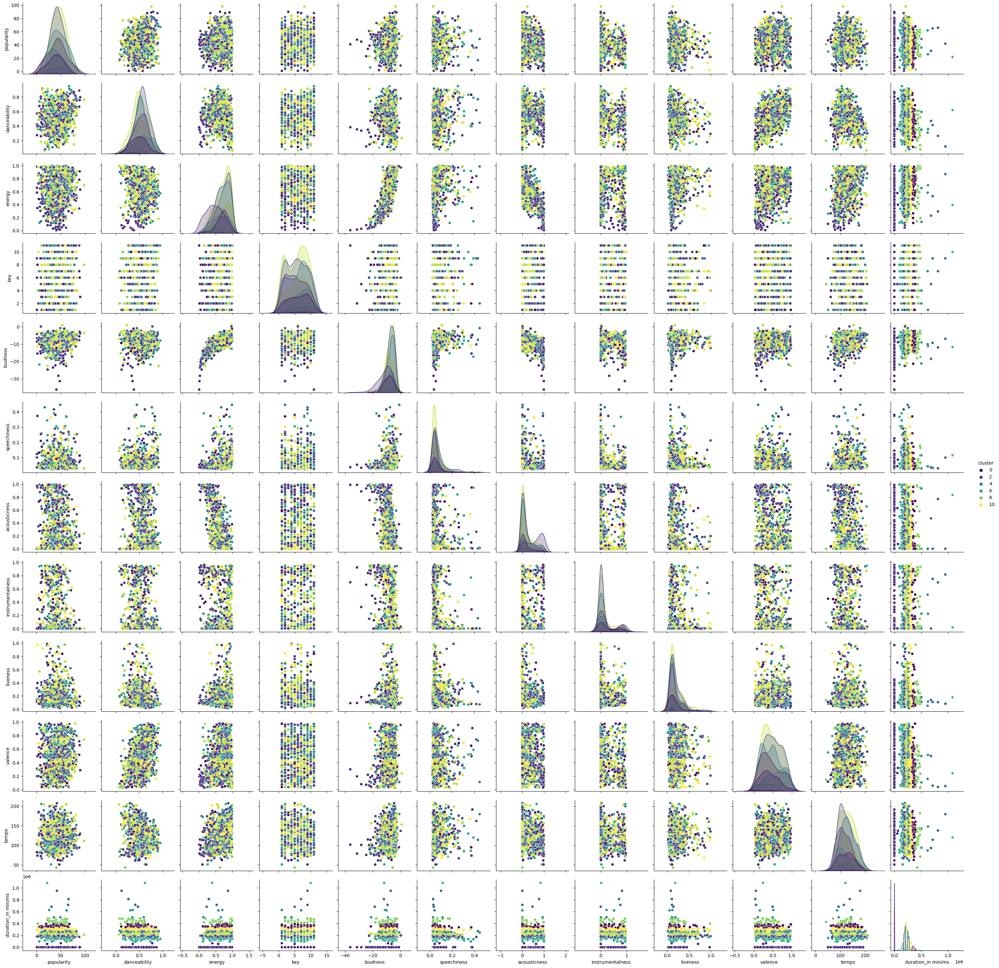

In [13]:
#Custering Code

clustering_data = pd.read_csv('spotify_song_data.csv').dropna()
clustering_data = clustering_data.drop(['artist_name', 'track_name', 'class', 'mode', 'time_signature'], axis=1) # artist_name and track_name were dropped because they are strings


#we will use Kmeans to cluster our songs in order to find classify smilar 'generes' of music
# Apply k-means clustering with k=11

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_data)

k = 11
kmeans = KMeans(n_clusters=k, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(clustering_data)

# Print the counts of each cluster
print("K = 1 Clusters")
print("Cluster Counts:")
print(clustering_data['cluster'].value_counts())

sns.pairplot(clustering_data.iloc[:1000, 1:], hue='cluster', palette='viridis')
plt.show()


K = 5 Clusters
Cluster Counts:
1    5608
4    3880
2    1539
0     746
3      40
Name: cluster, dtype: int64


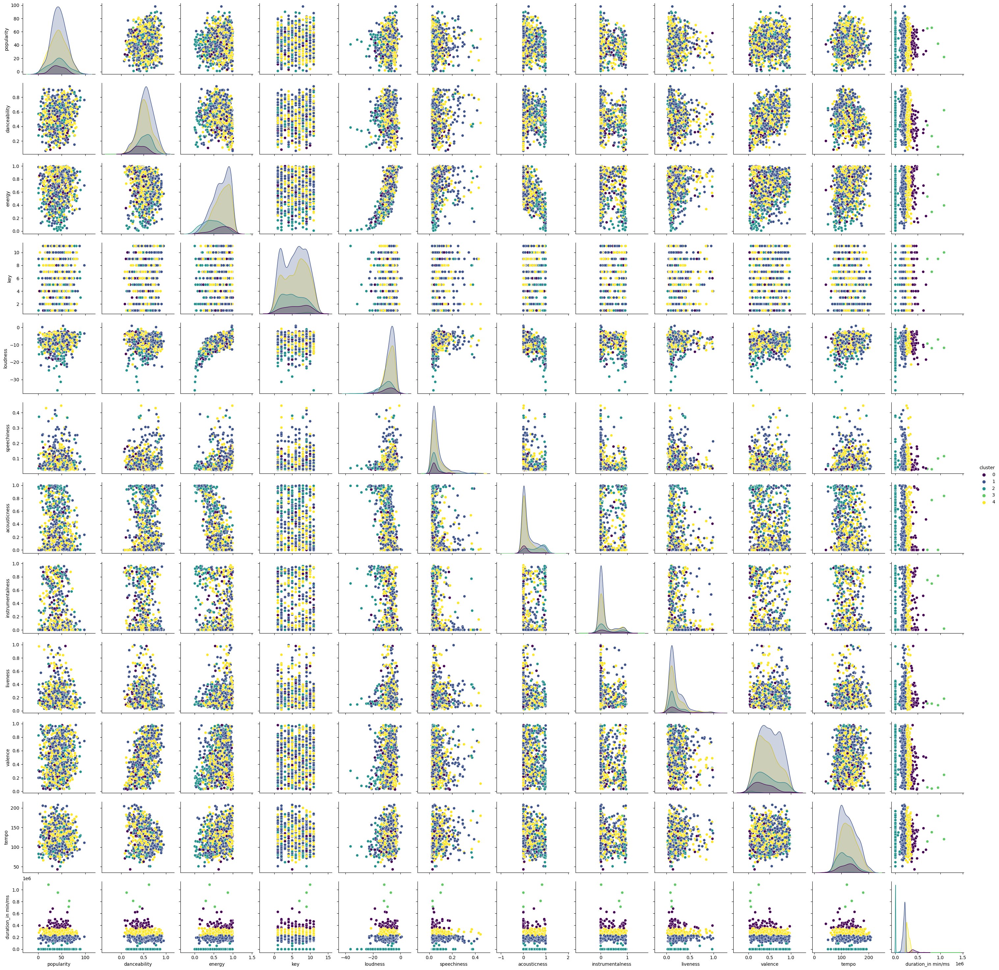

In [14]:
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(clustering_data)

# Print the counts of each cluster
print("K = 5 Clusters")
print("Cluster Counts:")
print(clustering_data['cluster'].value_counts())

sns.pairplot(clustering_data.iloc[:1000, 1:], hue='cluster', palette='viridis')
plt.show()

K = 25 Clusters
Cluster Counts:
1     1507
11    1073
0     1063
22     994
17     983
20     959
7      899
24     679
5      661
3      552
16     486
15     411
19     395
8      318
14     224
2      166
10     147
18     108
23      77
6       43
21      28
12      16
4        9
13       8
9        7
Name: cluster, dtype: int64


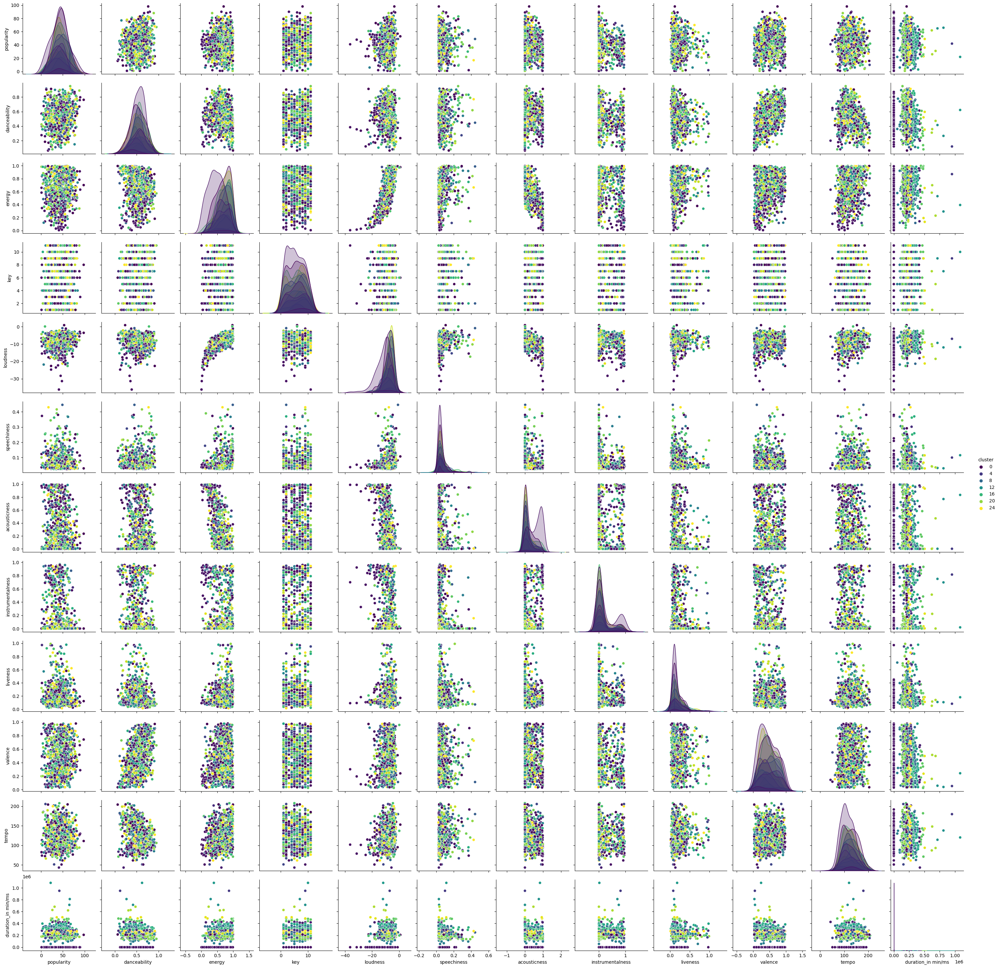

In [15]:
k = 25
kmeans = KMeans(n_clusters=k, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(clustering_data)

# Print the counts of each cluster
print("K = 25 Clusters")
print("Cluster Counts:")
print(clustering_data['cluster'].value_counts())

sns.pairplot(clustering_data.iloc[:1000, 1:], hue='cluster', palette='viridis')
plt.show()

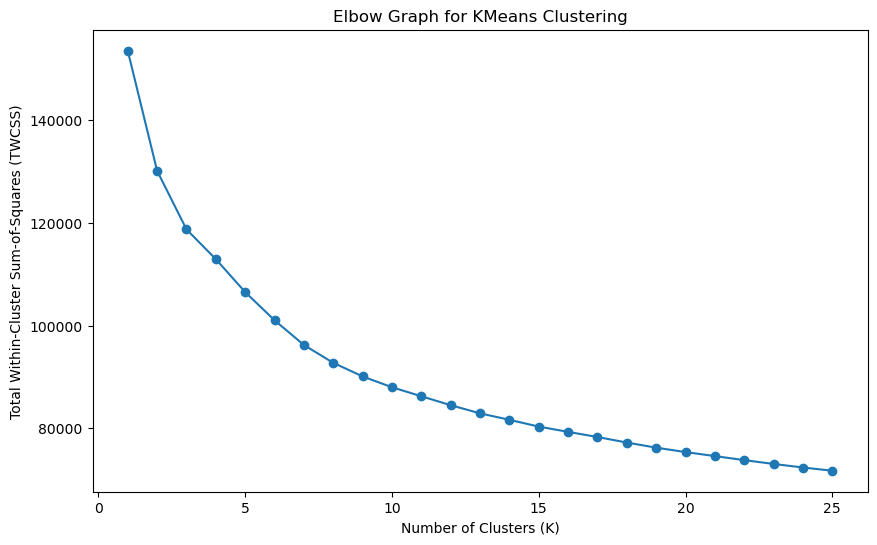

The elbox point seems to be around K = 8
K = 8 Clusters
Cluster Counts:
4    2768
1    2191
5    1875
7    1842
3    1317
0     631
6     631
2     558
Name: cluster, dtype: int64


In [20]:
# Create a function to calculate TWCSS for different values of K
def calculate_twcss(data, max_k):
    twcss = []
    for k in range(1, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        twcss.append(kmeans.inertia_)
    return twcss

# Plot the elbow graph
max_k_value = 25  # You can adjust this value based on the characteristics of your data
twcss_values = calculate_twcss(scaled_data, max_k_value)

plt.figure(figsize=(10, 6))
plt.plot(range(1, max_k_value + 1), twcss_values, marker='o')
plt.title('Elbow Graph for KMeans Clustering')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Total Within-Cluster Sum-of-Squares (TWCSS)')
plt.show()

print("The elbox point seems to be around K = 8")
# Choose the best K value based on the elbow graph
best_k = 8  # Adjust this based on the visual inspection of the elbow graph

# Perform KMeans clustering with the best K value
kmeans = KMeans(n_clusters=best_k, random_state=42)
clustering_data['cluster'] = kmeans.fit_predict(scaled_data)

# Print the counts of each cluster
print(f"K = {best_k} Clusters")
print("Cluster Counts:")
print(clustering_data['cluster'].value_counts())

<h2>Boosting </h2>
Boosting is a powerful technique in machine learning, specifically a type of supervised ensemble method designed to enhance the predictive accuracy of models. It operates by combining the outputs of multiple weak learners, typically decision trees, to create a robust and accurate final model. The key to boosting lies in its three main characteristics, which enable it to sequentially build a high-quality model:

1) Learn from your past mistakes

2) Trust high-quality models more

3) Re-weight data in statistical model constructions:

I will use XGBoost, as it is a fast and modern implementaion of gradient boosting, to imporve the performace of a model that predicts music's genre.

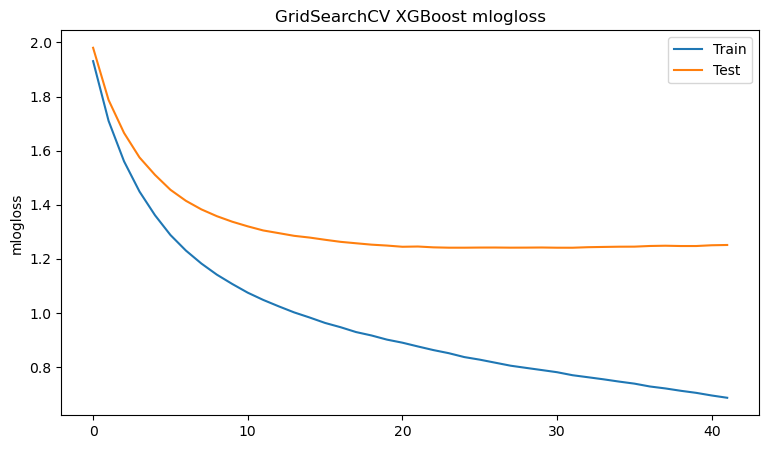

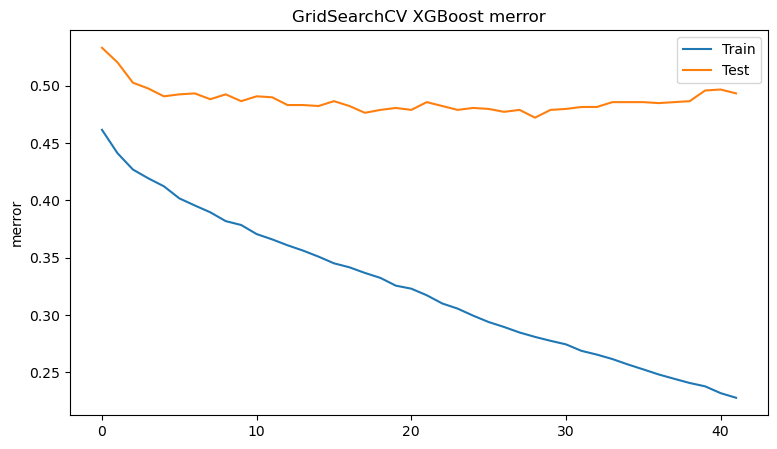

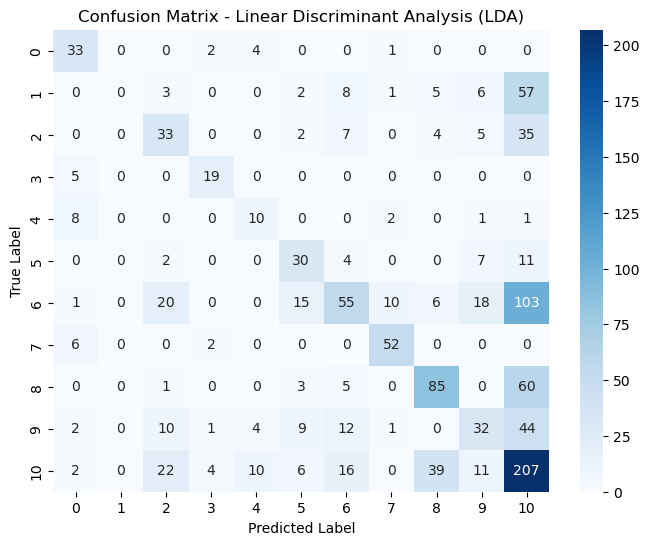

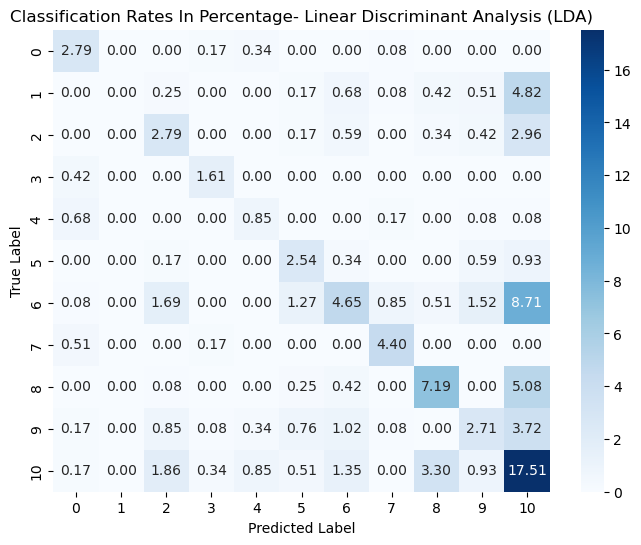


-------------------- Key Metrics --------------------

Accuracy: 0.52
Balanced Accuracy: 0.54

Micro Precision: 0.52
Micro Recall: 0.52
Micro F1-score: 0.52

Macro Precision: 0.56
Macro Recall: 0.54
Macro F1-score: 0.54

Weighted Precision: 0.51
Weighted Recall: 0.52
Weighted F1-score: 0.50


In [16]:

## ---------- XGBoost model  ----------

xgb_clf = xgb.XGBClassifier(objective='multi:softmax', 
                            num_class=11, 
                            missing=1, 
                            early_stopping_rounds=10, 
                            eval_metric=['merror','mlogloss'], 
                            seed=42)
xgb_clf.fit(X_train, 
            y_train,
            verbose=0, # set to 1 to see xgb training round intermediate results
            eval_set=[(X_train, y_train), (X_test, y_test)])

# preparing evaluation metric plots
results = xgb_clf.evals_result()
epochs = len(results['validation_0']['mlogloss'])
x_axis = range(0, epochs)

# xgboost 'mlogloss' plot
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
ax.legend()
plt.ylabel('mlogloss')
plt.title('GridSearchCV XGBoost mlogloss')
plt.show()

# xgboost 'merror' plot
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(x_axis, results['validation_0']['merror'], label='Train')
ax.plot(x_axis, results['validation_1']['merror'], label='Test')
ax.legend()
plt.ylabel('merror')
plt.title('GridSearchCV XGBoost merror')
plt.show()

## ---------- Model Classification Report ----------
## get predictions and create model quality report

y_pred = xgb_clf.predict(X_test)

plt.figure(figsize=(8, 6))

confus_mtrx_LDA = np.array(confusion_matrix(y_test, y_pred_LDA_default))
sns.heatmap(confus_mtrx_LDA, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

plt.figure(figsize=(8, 6))

classification_rates = (confus_mtrx_LDA / confus_mtrx_LDA.sum()) * 100
sns.heatmap(classification_rates, annot=True, fmt='.2f', cmap='Blues')
plt.title('Classification Rates In Percentage- Linear Discriminant Analysis (LDA)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print('\n-------------------- Key Metrics --------------------')
print('\nAccuracy: {:.2f}'.format(metrics.accuracy_score(y_test, y_pred)))
print('Balanced Accuracy: {:.2f}\n'.format(metrics.balanced_accuracy_score(y_test, y_pred)))

print('Micro Precision: {:.2f}'.format(metrics.precision_score(y_test, y_pred, average='micro')))
print('Micro Recall: {:.2f}'.format(metrics.recall_score(y_test, y_pred, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(metrics.f1_score(y_test, y_pred, average='micro')))

print('Macro Precision: {:.2f}'.format(metrics.precision_score(y_test, y_pred, average='macro')))
print('Macro Recall: {:.2f}'.format(metrics.recall_score(y_test, y_pred, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(metrics.f1_score(y_test, y_pred, average='macro')))

print('Weighted Precision: {:.2f}'.format(metrics.precision_score(y_test, y_pred, average='weighted')))
print('Weighted Recall: {:.2f}'.format(metrics.recall_score(y_test, y_pred, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(metrics.f1_score(y_test, y_pred, average='weighted')))

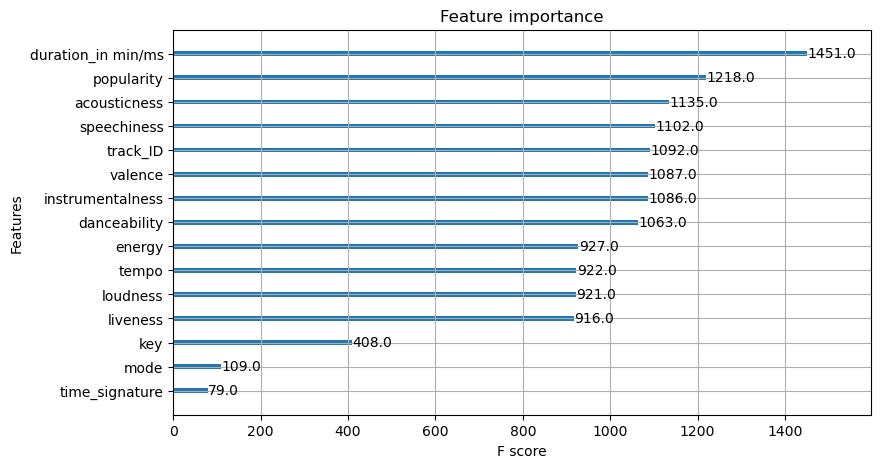

In [17]:
## ---------- Plot Feature Importance ----------
## plotting feature importance of best xgboost model (v3)

from xgboost import plot_importance

fig, ax = plt.subplots(figsize=(9,5))
plot_importance(xgb_clf, ax=ax)
plt.show()

In conclusion, XGBoost performed the best with an acuracy of 0.52 on the testing data. This can be furuther improved with Hyperparameters Fine-tuning using emthods such as Grid Search or optimization libraries such as Optuna.

<h2>Sources</h2>

LDA/QDA:
http://www.science.smith.edu/~jcrouser/SDS293/labs/lab5-py.html

SVM:
https://www.geeksforgeeks.org/support-vector-machine-algorithm/

Clustering:
https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1

Boosting:
https://www.datacamp.com/tutorial/xgboost-in-python